[Building RNN, LSTM, and GRU for time series using PyTorch • Revisiting the decade-long problem with a new toolkit • Kaan Kuguoglu • Towards Data Science](https://towardsdatascience.com/building-rnn-lstm-and-gru-for-time-series-using-pytorch-a46e5b094e7b)

Apr 14, 2021


Historically, time-series forecasting has been dominated by linear and ensemble methods since they are well-understood and highly effective on various problems when supported with feature engineering. Partly for this reason, Deep Learning has been somewhat neglected; in other words, it had less impact on time-series forecasting compared to other domains, such as image recognition, speech recognition, and NLP.

With the emergence of [Recurrent Neural Networks (RNN)](https://www.nature.com/articles/323533a0) in the ’80s, followed by more sophisticated RNN structures, namely [Long-Short Term Memory (LSTM)](https://direct.mit.edu/neco/article/9/8/1735/6109/Long-Short-Term-Memory) in 1997 and, more recently, [Gated Recurrent Unit (GRU)](https://arxiv.org/abs/1412.3555) in 2014, Deep Learning techniques enabled learning complex relations between sequential inputs and outputs with limited feature engineering. In short, these RNN techniques and the like hold great potential for analyzing large-scale time series in ways that were not previously practical.

In this post, I’d like to give you a bit of an introduction to some of the RNN structures, such as RNN, LSTM, and GRU, and help you get started building your deep learning models for time-series forecasting. Though not the focus of this article, I’ll provide some of the feature engineering techniques that are widely applied in time-series forecasting, such as one-hot encoding, lagging, and cyclical time features. I’ll use Scikit-learn, Pandas, and PyTorch, an open-source machine learning library primarily developed by Facebook’s AI Research lab. While the former two have long been a sweetheart of data scientists and machine learning practitioners, PyTorch is relatively new but steadily growing in popularity. Due to its recency, though, it has been somewhat difficult for me to find the relevant pieces of information and code samples from the get-go, which is usually a bit easier with frameworks that have been around for a while, say TensorFlow. So, I decided to put together the things I would have liked to know earlier. Less talk, more work: where do we start?


# Where’s the data?

Well, I suppose we need some time-series data to start with. Be it payment transactions or stock exchange data, time-series data is everywhere. One such public dataset is [PJM’s Hourly Energy Consumption](https://www.kaggle.com/robikscube/hourly-energy-consumption) data, a univariate time-series dataset of 10+ years of hourly observations collected from different US regions. I’ll be using the PJM East region data, which originally has the hourly energy consumption data from 2001 to 2018, but any of the datasets provided in the link should work.

Given that there are heaps of blogs on data visualizations out there, I’ll keep the exploratory data analysis (EDA) part very short. For those interested, I can recommend using Plotly to create interactive graphs. The following method will plot a simple interactive figure that allows you, well, to play with the dataset interactively.

In [17]:
import plotly.graph_objs as go
from plotly.offline import iplot


def plot_dataset(df, title):
    data = []
    value = go.Scatter(
        x=df.index,
        y=df.value,
        mode="lines",
        name="values",
        marker=dict(),
        text=df.index,
        line=dict(color="rgba(0,0,0, 0.3)"),
    )
    data.append(value)

    layout = dict(
        title=title,
        xaxis=dict(title="Date", ticklen=5, zeroline=False),
        yaxis=dict(title="Value", ticklen=5, zeroline=False),
    )

    fig = dict(data=data, layout=layout)
    iplot(fig)


import pandas as pd

df = pd.read_csv("PJME_hourly.csv")

df = df.set_index(["Datetime"])
df.index = pd.to_datetime(df.index)
df = df.sort_index()

df = df.rename(columns={"PJME_MW": "value"})
plot_dataset(
    df, title="PJM East (PJME) Region: estimated energy consumption in Megawatts (MW)"
)


The next step is to generate feature columns to transform our univariate dataset into a multivariate dataset. We will convert this time series into a supervised learning problem if you will. In some datasets, such features as hourly temperature, humidity, or precipitation, are readily available. However, in our data set, no extra information could help us predict the energy consumption is given. So, it falls to our lot to create such predictors, i.e., feature columns.

I’ll show you two popular ways to generate features: passing lagged observations as features and creating date time features from the DateTime index. Both approaches have their advantages and disadvantages, and each may prove more useful depending on the task at hand.

# Using lagged observations as features

Let’s start with using time steps as features. In other words, we’re trying to predict the next value, $X(t+n)$, from the previous $n$ observations $X(t)$, $X(t+1)$, …, and $X(t+n-1)$. Then, what we need to do is simply create $n$ columns with the preceding observations. Luckily, Pandas provides the method $shift()$ to shift the values in a column. So, we can write a for loop to create such lagged observations by shifting the values in a column by n times and removing the first $n$ columns. Lagging is simple yet a good starting point, especially if you don’t have many features to work with at the start.

In [18]:
from scipy.linalg import toeplitz

input_dim = 100
x = df["value"].to_numpy()
df_generated = pd.DataFrame(
    toeplitz(x[input_dim:], x[input_dim::-1]),
    columns=["value", *(f"lag{n}" for n in range(1, input_dim + 1))],
    index=df.index[input_dim:],
)
df_generated


,value,lag1,lag2,lag3,lag4,lag5,lag6,lag7,lag8,lag9,...,lag91,lag92,lag93,lag94,lag95,lag96,lag97,lag98,lag99,lag100
Datetime,,,,,,,,,,,,,,,,,,,,,
2002-01-05 05:00:00,26822.0,26669.0,27034.0,27501.0,28635.0,30924.0,33202.0,35368.0,36762.0,37539.0,...,30692.0,29943.0,29595.0,29308.0,28654.0,28057.0,27899.0,28357.0,29265.0,30393.0
2002-01-05 06:00:00,27399.0,26822.0,26669.0,27034.0,27501.0,28635.0,30924.0,33202.0,35368.0,36762.0,...,31395.0,30692.0,29943.0,29595.0,29308.0,28654.0,28057.0,27899.0,28357.0,29265.0
2002-01-05 07:00:00,28557.0,27399.0,26822.0,26669.0,27034.0,27501.0,28635.0,30924.0,33202.0,35368.0,...,31496.0,31395.0,30692.0,29943.0,29595.0,29308.0,28654.0,28057.0,27899.0,28357.0
2002-01-05 08:00:00,29709.0,28557.0,27399.0,26822.0,26669.0,27034.0,27501.0,28635.0,30924.0,33202.0,...,31031.0,31496.0,31395.0,30692.0,29943.0,29595.0,29308.0,28654.0,28057.0,27899.0
2002-01-05 09:00:00,31241.0,29709.0,28557.0,27399.0,26822.0,26669.0,27034.0,27501.0,28635.0,30924.0,...,30360.0,31031.0,31496.0,31395.0,30692.0,29943.0,29595.0,29308.0,28654.0,28057.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-08-02 20:00:00,44057.0,45641.0,46760.0,46816.0,46989.0,47154.0,46534.0,45372.0,43954.0,42189.0,...,28389.0,30789.0,33747.0,36581.0,37870.0,39089.0,40517.0,40709.0,39906.0,38637.0
2018-08-02 21:00:00,43256.0,44057.0,45641.0,46760.0,46816.0,46989.0,47154.0,46534.0,45372.0,43954.0,...,26779.0,28389.0,30789.0,33747.0,36581.0,37870.0,39089.0,40517.0,40709.0,39906.0
2018-08-02 22:00:00,41552.0,43256.0,44057.0,45641.0,46760.0,46816.0,46989.0,47154.0,46534.0,45372.0,...,25675.0,26779.0,28389.0,30789.0,33747.0,36581.0,37870.0,39089.0,40517.0,40709.0


After setting the number of input features, i.e., lagged observations, to 100, we get the following DataFrame with 101 columns, one for the actual value and the rest for the preceding 100 observations at each row.


# Generating features from timestamps

Despite its name, feature engineering is generally more art than science. Nonetheless, some rules of thumb can guide data scientists and the like. My goal in this section is not to go through all such practices here but to demonstrate a couple of them and let you experiment on your own. In effect, feature engineering is very much dependent on the domain you’re working in, possibly requiring the creation of a different set of features for the task at hand.

Having a univariate time-series dataset, it seems logical to generate date and time features. As we have already converted its index into Pandas’ DatetimeIndex type, a series of DateTime objects, we can easily create new features from the index values, like the hour of the day, the day of the month, the month, the day of the week and the week of the year, as follows.

In [19]:
df_features = pd.concat([
    df,
    df.index.isocalendar().drop(columns='year'),
    df.index.hour.to_series(df.index,'hour'),
    df.index.month.to_series(df.index,'month'),
    df.index.day.to_series(df.index,'day_of_month')
],axis=1).rename(columns={'day':'day_of_week','day_of_month':'day','week':'week_of_year'})
print(df_features)

                       value  week_of_year  day_of_week  hour  month  day
Datetime                                                                 
2002-01-01 01:00:00  30393.0             1            2     1      1    1
2002-01-01 02:00:00  29265.0             1            2     2      1    1
2002-01-01 03:00:00  28357.0             1            2     3      1    1
2002-01-01 04:00:00  27899.0             1            2     4      1    1
2002-01-01 05:00:00  28057.0             1            2     5      1    1
...                      ...           ...          ...   ...    ...  ...
2018-08-02 20:00:00  44057.0            31            4    20      8    2
2018-08-02 21:00:00  43256.0            31            4    21      8    2
2018-08-02 22:00:00  41552.0            31            4    22      8    2
2018-08-02 23:00:00  38500.0            31            4    23      8    2
2018-08-03 00:00:00  35486.0            31            5     0      8    3

[145366 rows x 6 columns]



Although passing date and time features to the model without any touch may work in practice, it would be harder for the model to learn interdependencies between these features. For us humans, it is rather straightforward to see the hours, days, weeks, and months follow somewhat cyclical patterns. While it is trivial for us to say that December is followed by January, it may not be apparent that the algorithms to understand the first month of the year come after the 12th one. One can easily come up with many more examples, for that matter. This makes good feature engineering crucial for building deep learning models, even more so for traditional machine learning models.


# One-hot Encoding

One way to encode DateTime features is to treat them as categorical variables and add a new binary variable for each unique value, widely known as one-hot encoding. Suppose you applied one-hot encoding on your month column, which ranges from 1 to 12. In this case, 12 new month columns are created, say `[Jan, Feb, … Dec]`, and only one of such columns has the value 1 while the rest is zeroed. For instance, some DateTime values from February should have the second of these encoded columns as 1, as in `[0, 1, … 0]`.

Using Pandas’ get_dummies method, we can quickly create one-hot encoded columns from a given dataset.

In [20]:
onehot_encode_pd = lambda df, col_name: pd.get_dummies(df, columns=[col_name])

onehot_encode_pd(df_features,'week_of_year')

,value,day_of_week,hour,month,day,week_of_year_1,week_of_year_2,week_of_year_3,week_of_year_4,week_of_year_5,...,week_of_year_44,week_of_year_45,week_of_year_46,week_of_year_47,week_of_year_48,week_of_year_49,week_of_year_50,week_of_year_51,week_of_year_52,week_of_year_53
Datetime,,,,,,,,,,,,,,,,,,,,,
2002-01-01 01:00:00,30393.0,2,1,1,1,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2002-01-01 02:00:00,29265.0,2,2,1,1,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2002-01-01 03:00:00,28357.0,2,3,1,1,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2002-01-01 04:00:00,27899.0,2,4,1,1,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2002-01-01 05:00:00,28057.0,2,5,1,1,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-08-02 20:00:00,44057.0,4,20,8,2,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2018-08-02 21:00:00,43256.0,4,21,8,2,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2018-08-02 22:00:00,41552.0,4,22,8,2,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False



Alternatively, you may wish to use Scikit-learn’s OneHotEncoder to encode a column in your DataFrame using the ColumnTransformer class. Unlike the Pandas way, ColumnTranformer outputs a Numpy array when it is called to fit the DataFrame.

In [21]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

def onehot_encode(df, onehot_columns):
    ct = ColumnTransformer(
        [('onehot', OneHotEncoder(drop='first'), onehot_columns)],
        remainder='passthrough'
        )
    return ct.fit_transform(df)

onehot_columns = ['hour']
onehot_encoded = onehot_encode(df_features, onehot_columns)



Though quite useful to encode categorical features, one-hot encoding does not fully capture the cyclical patterns in DateTime features. It simply creates categorical buckets, if you will, and lets the model learn from these seemingly independent features. Encoding the day of the week similarly, for instance, loses the information that Monday is closer to Tuesday than Wednesday.

For some use cases, this may not matter too much, indeed. In fact, with enough data, training time, and model complexity, the model may learn such relationships between such features independently. But there is also another way.

# Generating cyclical time features

As with all the data we have worked on until now, some data is inherently cyclical. Be it hours, days, weeks, or months, they all follow periodic cycles. Again, this is trivial for us to see, but not so much for machine learning models. How can we tell algorithms that hours 23 and 0 are as close as hour 1 is to hour 2?

The gist is to create two new cyclical features, calculating sine and cosine transform of the given `DateTime` feature, say the hour of the day. Instead of using the hour’s original value, the model then uses its sine transform, preserving its cyclicality. To see how and why it works, feel free to refer to Pierre-Louis’or [David’s](http://blog.davidkaleko.com/feature-engineering-cyclical-features.html) blog post on the matter, which explains the concept more in detail.

In [22]:
import numpy as np

def generate_cyclical_features(df, col_name, period, start_num=0):

    x = 2*np.pi*(df[col_name]-start_num)/period
    return pd.concat([df.drop(columns=col_name),pd.DataFrame({
        f'sin_{col_name}' : np.sin(x),
        f'cos_{col_name}' : np.cos(x)    
    })],axis=1)

df_features = generate_cyclical_features(df_features, 'hour', 24, 0)
# df_features = generate_cyclical_features(df_features, 'day_of_week', 7, 0)
# df_features = generate_cyclical_features(df_features, 'month', 12, 1)
# df_features = generate_cyclical_features(df_features, 'week_of_year', 52, 0)

df_features

,value,week_of_year,day_of_week,month,day,sin_hour,cos_hour
Datetime,,,,,,,
2002-01-01 01:00:00,30393.0,1,2,1,1,0.258819,0.965926
2002-01-01 02:00:00,29265.0,1,2,1,1,0.500000,0.866025
2002-01-01 03:00:00,28357.0,1,2,1,1,0.707107,0.707107
2002-01-01 04:00:00,27899.0,1,2,1,1,0.866025,0.500000
2002-01-01 05:00:00,28057.0,1,2,1,1,0.965926,0.258819
...,...,...,...,...,...,...,...
2018-08-02 20:00:00,44057.0,31,4,8,2,-0.866025,0.500000
2018-08-02 21:00:00,43256.0,31,4,8,2,-0.707107,0.707107
2018-08-02 22:00:00,41552.0,31,4,8,2,-0.500000,0.866025



A good thought exercise is probably to think about how separating one time feature into two would perform in decision tree-based models (Random Forest, Gradient Boosted Trees, and XGBoost). These features form their splits according to one feature at a time, meaning that it will fail to use two-time features, e.g., a sine and cosine transform, simultaneously. Usually, these models are robust enough to handle such splits, but it’s certainly food for thought.

# What about other features?

Considering we are now working with the energy consumption data, one might ask whether holidays in a year affect the energy consumption patterns. Indeed, very likely. For such binary variables, i.e., 0 or 1, we can generate extra columns with binary values to denote if a given date is actually a holiday. Remembering all the holidays or manually defining them is a tedious task, to say the least. Fortunately, a package, called holidays, does what it promises to do.


In [23]:
from datetime import date
import holidays

us_holidays = holidays.US()

def is_holiday(date):
    date = date.replace(hour = 0)
    return 1 if (date in us_holidays) else 0

def add_holiday_col(df, holidays):
    return df.assign(is_holiday = df.index.to_series().apply(is_holiday))


df_features = add_holiday_col(df_features, us_holidays)
df_features

,value,week_of_year,day_of_week,month,day,sin_hour,cos_hour,is_holiday
Datetime,,,,,,,,
2002-01-01 01:00:00,30393.0,1,2,1,1,0.258819,0.965926,1
2002-01-01 02:00:00,29265.0,1,2,1,1,0.500000,0.866025,1
2002-01-01 03:00:00,28357.0,1,2,1,1,0.707107,0.707107,1
2002-01-01 04:00:00,27899.0,1,2,1,1,0.866025,0.500000,1
2002-01-01 05:00:00,28057.0,1,2,1,1,0.965926,0.258819,1
...,...,...,...,...,...,...,...,...
2018-08-02 20:00:00,44057.0,31,4,8,2,-0.866025,0.500000,0
2018-08-02 21:00:00,43256.0,31,4,8,2,-0.707107,0.707107,0
2018-08-02 22:00:00,41552.0,31,4,8,2,-0.500000,0.866025,0


In feature engineering, possibilities are seemingly limitless, and there is certainly room for some experimentation and creativity. The good news is there are already quite a few packages out there that do the job for us, like [meteostat](https://github.com/meteostat/meteostat-python) for historical weather data or [yfinance](https://github.com/ranaroussi/yfinance) for stock market data. The bad one is, there is generally no clear answer to which additional features may improve the model performance without actually trying them out.

Just an idea, one can also try to include weather data, e.g., temperature, humidity, precipitation, wind, rain, snow, and so on, to learn how the weather affects the energy consumption in a given hour, day, week and month.

# Splitting the data into train, validation, and test sets

After creating feature columns, be it time-lagged observations or date/time features, we split the dataset into three different datasets: training, validation, and test sets. Since we’re dealing with time-dependent data, it is crucial to keep the time sequences intact, unshuffled if you will. You can easily do so by setting the parameter shuffle to false, avoiding shuffling while splitting into sets.


In [24]:
from sklearn.model_selection import train_test_split

def feature_label_split(df, target_col):
    y = df[[target_col]]
    X = df.drop(columns=[target_col])
    return X, y

def train_val_test_split(df, target_col, test_ratio):
    val_ratio = test_ratio / (1 - test_ratio)
    X, y = feature_label_split(df, target_col)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_ratio, shuffle=False)
    X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=val_ratio, shuffle=False)
    return X_train, X_val, X_test, y_train, y_val, y_test

X_train, X_val, X_test, y_train, y_val, y_test = train_val_test_split(df_features, 'value', 0.2)

Scaling the values in your dataset is a highly recommended practice for neural networks, as it is for other machine learning techniques. It speeds up the learning by making it easier for the model to update the weights. You can easily do that by using Scikit-learn’s scalers, MinMaxScaler, RobustScaler, Standard Scaler, and so on. For more information on the effects of each scaler, please refer to [the official documentation](https://scikit-learn.org/stable/auto_examples/preprocessing/plot_all_scaling.html).

In [25]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X_train_arr = scaler.fit_transform(X_train)
X_val_arr = scaler.transform(X_val)
X_test_arr = scaler.transform(X_test)

y_train_arr = scaler.fit_transform(y_train)
y_val_arr = scaler.transform(y_val)
y_test_arr = scaler.transform(y_test)


And, here is a cool trick if you’re looking for a way to switch between scalers quickly. Get yourself comfortable with the switcher function; we may use it again later on.

In [26]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler, MaxAbsScaler, RobustScaler

def get_scaler(scaler):
    scalers = {
        "minmax": MinMaxScaler,
        "standard": StandardScaler,
        "maxabs": MaxAbsScaler,
        "robust": RobustScaler,
    }
    return scalers.get(scaler.lower())()
    
scaler = get_scaler('robust')

# Loading the datasets into `DataLoaders`

After you standardize your data, you are usually good to go. Not so fast, this time. After spending quite some time working with PyTorch and going through others’ code on the internet, I noticed most people ended up doing the matrix operations for mini-batch training, i.e., slicing the data into smaller batches, using NumPy. You may think that’s what NumPy is for; I get it. But there is also a more elegant PyTorch way of doing it, which certainly gets much less attention than it should, in my opinion.

[PyTorch’s `DataLoader` class](https://pytorch.org/docs/stable/data.html), a Python iterable over Dataset, loads the data and splits them into batches for you to do mini-batch training. The most important argument for the `DataLoader` constructor is the `Dataset`, which indicates a dataset object to load data from. There are mainly two types of datasets: map-style datasets and iterable-style datasets.

I’ll use the latter in this tutorial, but feel free to check them out in [the official documentation](https://pytorch.org/docs/stable/data.html). It is also possible to write your own `Dataset` or `DataLoader` classes for your requirements, but that’s definitely beyond the scope of this post, as the built-in constructors would do more than suffice. But here’s a link to [the official tutorial on the topic](https://pytorch.org/tutorials/beginner/data_loading_tutorial.html).

For now, I’ll be using the class called `TensorDataset`, a dataset class wrapping the tensors. Since Scikit-learn’s scalers output NumPy arrays, I need to convert them into Torch tensors to load them into `TensorDatasets`. After creating Tensor datasets for each data set, I’ll use them to create my `DataLoader`s.


In [27]:
import torch
from torch.utils.data import TensorDataset, DataLoader

device = "cuda" if torch.cuda.is_available() else "cpu"

batch_size = 64

train_features = torch.Tensor(X_train_arr)
train_targets = torch.Tensor(y_train_arr)
val_features = torch.Tensor(X_val_arr)
val_targets = torch.Tensor(y_val_arr)
test_features = torch.Tensor(X_test_arr)
test_targets = torch.Tensor(y_test_arr)

train = TensorDataset(train_features, train_targets)
val = TensorDataset(val_features, val_targets)
test = TensorDataset(test_features, test_targets)

train_loader = DataLoader(train, batch_size=batch_size, shuffle=False, drop_last=True)
val_loader = DataLoader(val, batch_size=batch_size, shuffle=False, drop_last=True)
test_loader = DataLoader(test, batch_size=batch_size, shuffle=False, drop_last=True)
test_loader_one = DataLoader(test, batch_size=1, shuffle=False, drop_last=True)

You may notice an extra `DataLoader` with the batch size of 1 and wonder why the hell we need it. The short answer, it’s not a must-have but a nice-to-have. Like mini-batch training, you can also do mini-batch testing to evaluate the model’s performance, which is likely much faster due to tensor operations. However, doing so will drop the last time steps that couldn’t make up a batch, leading to losing these data points. This will not likely result in a significant change in your error metrics unless your batch size is huge.

From a more aesthetical standpoint, if one is interested in making predictions into the future, discarding the last time steps may cause a discontinuity from the test set to forecasted values. As for the training and validation DataLoaders, this effect can be tolerated due to significant performance improvement batching provides in training and such dropped time steps being less visible.

# Building Recurrent Neural Networks (RNN)

I don’t think I can ever do justice to RNNs if I try to explain the nitty-gritty of how they work in just a few sentences here. Fortunately, there are several well-written articles on these networks for those who are looking for a place to start, [Andrej Karpathy’s The Unreasonable Effectiveness of Recurrent Neural Networks](http://karpathy.github.io/2015/05/21/rnn-effectiveness/), [Chris Olah’s Understanding LSTM networks](https://colah.github.io/posts/2015-08-Understanding-LSTMs/), and [Michael Phi’s Illustrated Guide to LSTM’s and GRU’s: A step by step explanation](https://towardsdatascience.com/illustrated-guide-to-lstms-and-gru-s-a-step-by-step-explanation-44e9eb85bf21) are a few that come to mind.

If you’ve watched the movie Memento -definitely a great watch btw- you may already have an idea about how hard it could be to make predictions with memory loss. While your memory is being reset every couple of minutes, it can easily become impossible to tell what is happening, where you are going, or why -let alone tracking down your wife’s murderer. The same can also be said for working with sequential data, be it words or retail sales data. Generally speaking, having the preceding data points helps you understand patterns, build a complete picture and make better predictions.

However, traditional neural networks can’t do this, and they start from scratch every time they are given a task, pretty much like Leonard, you see. RNN addresses this shortcoming. To make a gross oversimplification, they do so by looping the information from one step of the network to the next, allowing information to persist within the network. This makes them a pretty strong candidate to solve various problems involving sequential data, such as speech recognition, language translation, or time-series forecasting, as we will see in a bit.

## Vanilla RNN

By extending PyTorch’s [`nn.Module`](https://pytorch.org/docs/stable/generated/torch.nn.Module.html), a base class for all neural network modules, we define our RNN module as follows. Our RNN module will have one or more RNN layers connected by a fully connected layer to convert the RNN output into desired output shape. We also need to define the forward propagation function as a class method, called `forward()`. This method is executed sequentially, passing the inputs and the zero-initialized hidden state. Nonetheless, PyTorch automatically creates and computes the backpropagation function `backward()`.

In [28]:
from torch import nn

class RNNModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, layer_dim, output_dim, dropout_prob):
        super(RNNModel, self).__init__()

        # Defining the number of layers and the nodes in each layer
        self.hidden_dim = hidden_dim
        self.layer_dim = layer_dim

        # RNN layers
        self.rnn = nn.RNN(
            input_dim, hidden_dim, layer_dim, batch_first=True, dropout=dropout_prob
        )
        # Fully connected layer
        self.fc = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        # Initializing hidden state for first input with zeros
        h0 = torch.zeros(self.layer_dim, x.size(0), self.hidden_dim).requires_grad_()

        # Forward propagation by passing in the input and hidden state into the model
        out, h0 = self.rnn(x, h0.detach())

        # Reshaping the outputs in the shape of (batch_size, seq_length, hidden_size)
        # so that it can fit into the fully connected layer
        out = out[:, -1, :]

        # Convert the final state to our desired output shape (batch_size, output_dim)
        out = self.fc(out)
        return out


Vanilla RNN has one shortcoming, though. Simple RNNs can connect previous information to the current one, where the temporal gap between the relevant past information and the current one is small. As that gap grows, RNNs become less capable of learning the long-term dependencies. This is where LSTM comes for help.

## Long Short-Term Memory (LSTM)

Long Short-Term Memory, LSTM for short, is a special type of recurrent network capable of learning long-term dependencies and tends to work much better than the standard version on a wide variety of tasks. RNNs on steroids, so to speak.

The standard version’s main difference is that, in addition to the hidden state, LSTMs have the cell state, which works like a conveyor belt that carries the relevant information from the earlier steps to later steps. Along the way, the new information is added to or removed from the cell state via input and forget gates, two neural networks that determine which information is relevant.

From the implementation standpoint, you don’t really have to bother with such details. All you need to add is a cell state in your `forward()` method.

In [29]:
class LSTMModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, layer_dim, output_dim, dropout_prob):
        super(LSTMModel, self).__init__()

        # Defining the number of layers and the nodes in each layer
        self.hidden_dim = hidden_dim
        self.layer_dim = layer_dim

        # LSTM layers
        self.lstm = nn.LSTM(
            input_dim, hidden_dim, layer_dim, batch_first=True, dropout=dropout_prob
        )

        # Fully connected layer
        self.fc = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        # Initializing hidden state for first input with zeros
        h0 = torch.zeros(self.layer_dim, x.size(0), self.hidden_dim).requires_grad_()

        # Initializing cell state for first input with zeros
        c0 = torch.zeros(self.layer_dim, x.size(0), self.hidden_dim).requires_grad_()

        # We need to detach as we are doing truncated backpropagation through time (BPTT)
        # If we don't, we'll backprop all the way to the start even after going through another batch
        # Forward propagation by passing in the input, hidden state, and cell state into the model
        out, (hn, cn) = self.lstm(x, (h0.detach(), c0.detach()))

        # Reshaping the outputs in the shape of (batch_size, seq_length, hidden_size)
        # so that it can fit into the fully connected layer
        out = out[:, -1, :]

        # Convert the final state to our desired output shape (batch_size, output_dim)
        out = self.fc(out)

        return out

## Gated Recurrent Unit (GRU)

Gated Recurrent Units (GRU) is a slightly more streamlined variant that provides comparable performance and considerably faster computation. Like LSTMs, they also capture long-term dependencies, but they do so by using reset and update gates without any cell state.

While the update gate determines how much of the past information needs to be kept, the reset gate decides how much of the past information to forget. Doing fewer tensor operations, GRUs are often faster and require less memory than LSTMs. As you see below, its model class is almost identical to the RNN’s.

In [30]:
class GRUModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, layer_dim, output_dim, dropout_prob):
        super(GRUModel, self).__init__()

        # Defining the number of layers and the nodes in each layer
        self.layer_dim = layer_dim
        self.hidden_dim = hidden_dim

        # GRU layers
        self.gru = nn.GRU(
            input_dim, hidden_dim, layer_dim, batch_first=True, dropout=dropout_prob
        )

        # Fully connected layer
        self.fc = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        # Initializing hidden state for first input with zeros
        h0 = torch.zeros(self.layer_dim, x.size(0), self.hidden_dim).requires_grad_()

        # Forward propagation by passing in the input and hidden state into the model
        out, _ = self.gru(x, h0.detach())

        # Reshaping the outputs in the shape of (batch_size, seq_length, hidden_size)
        # so that it can fit into the fully connected layer
        out = out[:, -1, :]

        # Convert the final state to our desired output shape (batch_size, output_dim)
        out = self.fc(out)

        return out

Similar to the trick we do with scalers, we can also easily switch between these models we just created.

In [31]:
def get_model(model, model_params):
    models = {
        "rnn": RNNModel,
        "lstm": LSTMModel,
        "gru": GRUModel,
    }
    return models.get(model.lower())(**model_params)

Now, it seems like we got everything ready to train our RNN models. But where do we start?

# Training the model

Let’s start by creating the main framework for training the models. There are probably heaps of ways to do this, and one of them is to use a helper, or a wrapper, class that holds the training, validation, and evaluation methods. First, we need to have a model class, a loss function to calculate the losses, and an optimizer to update the network’s weights.

If you’re familiar with neural networks, you already know that training them is a rather repetitive process, looping back and forth between forward-prop and back-prop. I find it useful to have one level of abstraction, a train step function or wrapper, to combine these repetitive steps.

In [32]:
import matplotlib.pyplot as plt

class Optimization:
    """Optimization is a helper class that allows training, validation, prediction.

    Optimization is a helper class that takes model, loss function, optimizer function
    learning scheduler (optional), early stopping (optional) as inputs. In return, it
    provides a framework to train and validate the models, and to predict future values
    based on the models.

    Attributes:
        model (RNNModel, LSTMModel, GRUModel): Model class created for the type of RNN
        loss_fn (torch.nn.modules.Loss): Loss function to calculate the losses
        optimizer (torch.optim.Optimizer): Optimizer function to optimize the loss function
        train_losses (list[float]): The loss values from the training
        val_losses (list[float]): The loss values from the validation
        last_epoch (int): The number of epochs that the models is trained
    """
    def __init__(self, model, loss_fn, optimizer):
        """
        Args:
            model (RNNModel, LSTMModel, GRUModel): Model class created for the type of RNN
            loss_fn (torch.nn.modules.Loss): Loss function to calculate the losses
            optimizer (torch.optim.Optimizer): Optimizer function to optimize the loss function
        """
        self.model = model
        self.loss_fn = loss_fn
        self.optimizer = optimizer
        self.train_losses = []
        self.val_losses = []
        
    def train_step(self, x, y):
        """The method train_step completes one step of training.

        Given the features (x) and the target values (y) tensors, the method completes
        one step of the training. First, it activates the train mode to enable back prop.
        After generating predicted values (yhat) by doing forward propagation, it calculates
        the losses by using the loss function. Then, it computes the gradients by doing
        back propagation and updates the weights by calling step() function.

        Args:
            x (torch.Tensor): Tensor for features to train one step
            y (torch.Tensor): Tensor for target values to calculate losses

        """
        # Sets model to train mode
        self.model.train()

        # Makes predictions
        yhat = self.model(x)

        # Computes loss
        loss = self.loss_fn(y, yhat)

        # Computes gradients
        loss.backward()

        # Updates parameters and zeroes gradients
        self.optimizer.step()
        self.optimizer.zero_grad()

        # Returns the loss
        return loss.item()

    def train(self, train_loader, val_loader, batch_size=64, n_epochs=50, n_features=1):
        """The method train performs the model training

        The method takes DataLoaders for training and validation datasets, batch size for
        mini-batch training, number of epochs to train, and number of features as inputs.
        Then, it carries out the training by iteratively calling the method train_step for
        n_epochs times. If early stopping is enabled, then it  checks the stopping condition
        to decide whether the training needs to halt before n_epochs steps. Finally, it saves
        the model in a designated file path.

        Args:
            train_loader (torch.utils.data.DataLoader): DataLoader that stores training data
            val_loader (torch.utils.data.DataLoader): DataLoader that stores validation data
            batch_size (int): Batch size for mini-batch training
            n_epochs (int): Number of epochs, i.e., train steps, to train
            n_features (int): Number of feature columns

        """
        model_path = f'{self.model}_{datetime.now().strftime("%Y-%m-%d %H:%M:%S")}'

        for epoch in range(1, n_epochs + 1):
            batch_losses = []
            for x_batch, y_batch in train_loader:
                x_batch = x_batch.view([batch_size, -1, n_features]).to(device)
                y_batch = y_batch.to(device)
                loss = self.train_step(x_batch, y_batch)
                batch_losses.append(loss)
            training_loss = np.mean(batch_losses)
            self.train_losses.append(training_loss)

            with torch.no_grad():
                batch_val_losses = []
                for x_val, y_val in val_loader:
                    x_val = x_val.view([batch_size, -1, n_features]).to(device)
                    y_val = y_val.to(device)
                    self.model.eval()
                    yhat = self.model(x_val)
                    val_loss = self.loss_fn(y_val, yhat).item()
                    batch_val_losses.append(val_loss)
                validation_loss = np.mean(batch_val_losses)
                self.val_losses.append(validation_loss)

            if (epoch <= 10) | (epoch % 50 == 0):
                print(
                    f"[{epoch}/{n_epochs}] Training loss: {training_loss:.4f}\t Validation loss: {validation_loss:.4f}"
                )

        torch.save(self.model.state_dict(), model_path)

    def evaluate(self, test_loader, batch_size=1, n_features=1):
        """The method evaluate performs the model evaluation

        The method takes DataLoaders for the test dataset, batch size for mini-batch testing,
        and number of features as inputs. Similar to the model validation, it iteratively
        predicts the target values and calculates losses. Then, it returns two lists that
        hold the predictions and the actual values.

        Note:
            This method assumes that the prediction from the previous step is available at
            the time of the prediction, and only does one-step prediction into the future.

        Args:
            test_loader (torch.utils.data.DataLoader): DataLoader that stores test data
            batch_size (int): Batch size for mini-batch training
            n_features (int): Number of feature columns

        Returns:
            list[float]: The values predicted by the model
            list[float]: The actual values in the test set.

        """
        with torch.no_grad():
            predictions = []
            values = []
            for x_test, y_test in test_loader:
                x_test = x_test.view([batch_size, -1, n_features]).to(device)
                y_test = y_test.to(device)
                self.model.eval()
                yhat = self.model(x_test)
                predictions.append(yhat.to(device).detach().numpy())
                values.append(y_test.to(device).detach().numpy())

        return predictions, values

    def plot_losses(self):
        """The method plots the calculated loss values for training and validation
        """
        plt.plot(self.train_losses, label="Training loss")
        plt.plot(self.val_losses, label="Validation loss")
        plt.legend()
        plt.title("Losses")
        plt.show()
        plt.close()

After defining one proper training step, we can now move onto writing the training loop where this step function will be called at each epoch. During each epoch in training, there are two stages: training and validation. After each training step, the network’s weights are tweaked a bit to minimize the loss function. Then, the validation step will evaluate the current state of the model to see if there has been any improvement after the most recent update.

I’ll be using mini-batch training, a training technique where only a portion of data is used at each epoch. Given a large enough batch size, the model can learn and update its weights more efficiently by only learning a sample of the data. This usually requires reshaping each batch tensor into the correct input dimensions so that the network can use it as an input. In order to reap the computational benefits of tensor operations, I defined our RNN models to operate with 3D input tensors earlier, unless you haven’t noticed already. So, you may think of each batch as packages of data, like boxes in a warehouse, with dimensions of *batch size*, *sequence length*, and *`input_dim`*.

There are also two for loops for each stage where a model is trained and validated batch by batch. It is important to activate the `train()` mode during training and the `eval()` mode during the validation. While the `train()` mode allows the network’s weights to be updated, the `eval()` mode signals the model that there is no need to calculate the gradients. Hence, the weights get updated or stay the same depending on the operation.

Now, we can finally train our model. However, without evaluating these models with a separate test set, i.e., a hold-out set, it would be impossible to tell how the model performs compared to other models we’re building. Much similar to the validation loop in the `train()` method, we’ll define a testing method to evaluate our models as follows.


During the training, the loss function outputs are generally a good indicator of whether the model is learning, overfitting, or underfitting. For this reason, we’ll be plotting simple loss figures by using the following method.

## Training

So far, we have prepared our dataset, defined our model classes and the wrapper class. We need to put all of them together. You can find some of the hyperparameters defined in the code snippet below, and I encourage you to play with them as you wish. The code below will build an LSTM model using the module we defined earlier. You can also build RNN or GRU models by quickly changing the input of the function `get_model` from “`lstm`” to a model of your choice. Without further ado, let’s start training our model.


[1/100] Training loss: 0.0200	 Validation loss: 0.0257
[2/100] Training loss: 0.0186	 Validation loss: 0.0215
[3/100] Training loss: 0.0181	 Validation loss: 0.0196
[4/100] Training loss: 0.0178	 Validation loss: 0.0176
[5/100] Training loss: 0.0172	 Validation loss: 0.0162
[6/100] Training loss: 0.0168	 Validation loss: 0.0154
[7/100] Training loss: 0.0164	 Validation loss: 0.0151
[8/100] Training loss: 0.0162	 Validation loss: 0.0150
[9/100] Training loss: 0.0158	 Validation loss: 0.0148
[10/100] Training loss: 0.0155	 Validation loss: 0.0145
[50/100] Training loss: 0.0069	 Validation loss: 0.0073
[100/100] Training loss: 0.0065	 Validation loss: 0.0076


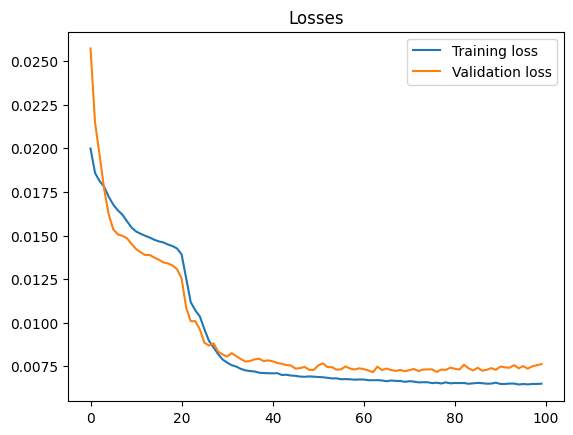

In [33]:
import torch.optim as optim
from datetime import datetime

input_dim = len(X_train.columns)
output_dim = 1
hidden_dim = 64
layer_dim = 3
batch_size = 64
dropout = 0.2
n_epochs = 100
learning_rate = 1e-3
weight_decay = 1e-6

model_params = {'input_dim': input_dim,
                'hidden_dim' : hidden_dim,
                'layer_dim' : layer_dim,
                'output_dim' : output_dim,
                'dropout_prob' : dropout}

model = get_model('lstm', model_params)

loss_fn = nn.MSELoss(reduction="mean")
optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

opt = Optimization(model=model, loss_fn=loss_fn, optimizer=optimizer)
opt.train(train_loader, val_loader, batch_size=batch_size, n_epochs=n_epochs, n_features=input_dim)
opt.plot_losses()

predictions, values = opt.evaluate(test_loader_one, batch_size=1, n_features=input_dim)

In [35]:
print(X_train)

                     week_of_year  day_of_week  month  day  sin_hour  \
Datetime                                                               
2002-01-01 01:00:00             1            2      1    1  0.258819   
2002-01-01 02:00:00             1            2      1    1  0.500000   
2002-01-01 03:00:00             1            2      1    1  0.707107   
2002-01-01 04:00:00             1            2      1    1  0.866025   
2002-01-01 05:00:00             1            2      1    1  0.965926   
...                           ...          ...    ...  ...       ...   
2011-12-14 20:00:00            50            3     12   14 -0.866025   
2011-12-14 21:00:00            50            3     12   14 -0.707107   
2011-12-14 22:00:00            50            3     12   14 -0.500000   
2011-12-14 23:00:00            50            3     12   14 -0.258819   
2011-12-15 00:00:00            50            4     12   15  0.000000   

                     cos_hour  is_holiday  
Datetime           


As you may recall, we trained our network with standardized inputs; therefore, all the model’s predictions are also scaled. Also, after using batching in our evaluation method, all of our predictions are now in batches. To calculate error metrics and plot these predictions, we need first to reduce these multi-dimensional tensors to a one-dimensional vector, i.e., flatten, and then apply `inverse_transform()` to get the predictions’ real values.

In [34]:
def inverse_transform(scaler, df, columns):
    for col in columns:
        df[col] = scaler.inverse_transform(df[col])
    return df


def format_predictions(predictions, values, df_test, scaler):
    vals = np.concatenate(values, axis=0).ravel()
    preds = np.concatenate(predictions, axis=0).ravel()
    df_result = pd.DataFrame(data={"value": vals, "prediction": preds}, index=df_test.head(len(vals)).index)
    df_result = df_result.sort_index()
    df_result = inverse_transform(scaler, df_result, [["value", "prediction"]])
    return df_result


df_result = format_predictions(predictions, values, X_test, scaler)

NotFittedError: This RobustScaler instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

After flattening and de-scaling the values, we can now calculate error metrics, such as mean absolute error (MAE), mean squared error (MSE), and root mean squared error (RMSE).

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

def calculate_metrics(df):
    return {'mae' : mean_absolute_error(df.value, df.prediction),
            'rmse' : mean_squared_error(df.value, df.prediction) ** 0.5,
            'r2' : r2_score(df.value, df.prediction)}

result_metrics = calculate_metrics(df_result)


0.64 $R^2$-score… Not great, not terrible. As you can also see in the next section, there is room for improvement, which you can achieve by engineering better features and trying out different hyper-parameters. I’ll leave that challenge to you.

## Generating baseline predictions

Having some sort of baseline model helps us compare how our models actually do at prediction. For this task, I’ve chosen good old linear regression, good enough to generate a reasonable baseline but simple enough to do it fast.

In [ ]:
from sklearn.linear_model import LinearRegression

def build_baseline_model(df, test_ratio, target_col):
    X, y = feature_label_split(df, target_col)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_ratio, shuffle=False
    )
    model = LinearRegression()
    model.fit(X_train, y_train)
    prediction = model.predict(X_test)

    result = pd.DataFrame(y_test)
    result["prediction"] = prediction
    result = result.sort_index()

    return result

df_baseline = build_baseline_model(df_features, 0.2, 'value')
baseline_metrics = calculate_metrics(df_baseline)

## Visualizing the predictions

Last but not least, visualizing your results helps you better understand how your model performs and adds what features would likely improve it. I’ll be using Plotly again, but feel free to use a package that you are more comfortable with.

In [ ]:
import plotly.offline as pyo

def plot_predictions(df_result, df_baseline):
    data = []
    
    value = go.Scatter(
        x=df_result.index,
        y=df_result.value,
        mode="lines",
        name="values",
        marker=dict(),
        text=df_result.index,
        line=dict(color="rgba(0,0,0, 0.3)"),
    )
    data.append(value)

    baseline = go.Scatter(
        x=df_baseline.index,
        y=df_baseline.prediction,
        mode="lines",
        line={"dash": "dot"},
        name='linear regression',
        marker=dict(),
        text=df_baseline.index,
        opacity=0.8,
    )
    data.append(baseline)
    
    prediction = go.Scatter(
        x=df_result.index,
        y=df_result.prediction,
        mode="lines",
        line={"dash": "dot"},
        name='predictions',
        marker=dict(),
        text=df_result.index,
        opacity=0.8,
    )
    data.append(prediction)
    
    layout = dict(
        title="Predictions vs Actual Values for the dataset",
        xaxis=dict(title="Time", ticklen=5, zeroline=False),
        yaxis=dict(title="Value", ticklen=5, zeroline=False),
    )

    fig = dict(data=data, layout=layout)
    iplot(fig)
    
    
# Set notebook mode to work in offline
pyo.init_notebook_mode()

plot_predictions(df_result, df_baseline)

# Final words

I’d like to say that was all, but there’s and will be certainly more. Deep learning has been one of if not, the most fruitful, research areas in machine learning. The research on the sequential deep learning models is growing and will likely keep growing in the future. You may consider this post as the first step into exploring what these techniques have to offer for time series forecasting. For those who enjoyed this one and are interested in predicting future values using these algorithms, I have recently published [another article](https://bkaankuguoglu.medium.com/predicting-future-values-with-rnn-lstm-and-gru-using-pytorch-d9ef50991ec7) on the topic.

Here’s a [link](https://colab.research.google.com/drive/1enI68fTdPI2w5KKv6jyL0Lcq9Zg3BbLx?usp=sharing) to Google Colab notebook for this post, if you’d like to have a look at the complete notebook and play with it. If there are things that don’t add up or you disagree, please reach out to me or let me know in the comments. That also goes for all sorts of feedback you may have.

There are still a few more topics that I’d like to write about, like forecasting into the future time steps using time-lagged and DateTime features, regularization techniques, some of which we have already used in this post, and more advanced deep learning architectures for time series. And, the list goes on. Let’s hope my motivation lives up to such ambitions.

But, for now, that’s a wrap.